# ESFS example workflow - Parigi et al. 2022 mouse gut spatial transcriptomic
In this workflow we apply ESFS to a mouse gut spatial transcriptomics dataset from Parigi et al. 2022. This case study show that ESFS is able to find a subset of genes that reveal distinct cell types in the adult gut. We then show that the ES-FMG combinatorial marker gene identification software finds biolgically relevent gene expression profiles that non-negative matrix factorisation (NMF) fail to identify.


In [1]:
### Data path
path = "/Users/radleya/The Francis Crick Dropbox/BriscoeJ/Radleya/ESFS_Paper/Paper_Submission/Data/Paragi2022_Mouse_Colon_Example/"

In [2]:
from IPython.display import Image, display
display(Image(filename=path+"Workflow_Image.png"))

### Import ESFS package

In [3]:
import esfs

### Import additional packages

In [4]:
import plotly.express as px
from scipy.sparse import csc_matrix
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import FuncNorm
from matplotlib.cm import get_cmap
from mpl_toolkits.axes_grid1 import make_axes_locatable
import pandas as pd
import scanpy as sc

### Set python default discrete class colour palette to one with more colours

In [5]:
Colours = px.colors.qualitative.Dark24
Colours.remove('#222A2A') # Remove black form the color palette (personal preference).
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=Colours)

def _forward(x):
    return np.sqrt(x)

def _inverse(x):
    return x**2

### Load data

In [6]:
adata = sc.read_h5ad(path+"ES_adata.h5ad")

In [7]:
adata

AnnData object with n_obs × n_vars = 2604 × 13514
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'ESFS_Gene_Weights', 'ES_Rank'
    obsm: 'Leiden_Clusts_Secondary_Features', 'Leiden_Clusts_Secondary_Features_Max_ESS_Features', 'spatial_coordinates'
    varm: 'Leiden_Clusts_Secondary_Features_ESSs', 'Leiden_Clusts_Secondary_Features_Max_Combinatorial_ESSs', 'Leiden_Clusts_Secondary_Features_Max_ESS_Features_ESSs', 'Leiden_Clusts_Secondary_Features_SGs', 'Self_EPs', 'Self_ESSs'
    layers: 'Scaled_Counts', 'Smoothed_Expression'

### Create and save a scaled version of the scRNA-seq counts matrix
Create and save a scaled version of the scRNA-seq counts matrix where each genes has their observed expression values clipped if above a percentile threshold (default=97.5) and are then normalised by their maximum values so that all values are between 0-1, which is a requirment for the Entropy Sort Score (ESS) and Error Potential (EP) calcualtions.

In [8]:
adata = esfs.Create_Scaled_Matrix(adata,log_scale=False)

Scaled expression matrix has been saved to 'adata.layers['Scaled_Counts']' as a sparse csc_matrix


### Entropy Sorting Gene Set Selection (ES-GSS)

The following step use ES derived functions to perform feature selection that focuses downstream analysis on biologically relevent gene expression profiles.

## Calculate ESS and EP matricies
Here we use the theory of Entropy Sorting to generate a pairwise gene correlation matrix (ESS matrix) and a correlation significance matrix (EP matrix). To speed up calculations parallel processing is implemented. To control the number of cores used for processing, vary the "Use_Cores" parameter which deaults to "Use_Cores=-1" which indicates the software will use n-1 cores, where n is the number of cores available on your machine. 
Please note that "Use_Cores=-1" is as special flag and "Use_Cores=-2" will not use n-2 cores. You should instead change "Use_Cores" to positive integer values of the number of cores you would like to use.

In [9]:
adata = esfs.Parallel_Calc_ES_Matricies(adata, Secondary_Features_Label="Self", save_matrices=np.array(["ESSs","EPs"]), Use_Cores=-1)

Cores Available: 16
Cores Used: 15
Calculating ESS and EP matricies.
If progress bar freezes consider increasing system memory or reducing number of cores used with the 'Use_Cores' parameter as you may have hit a memory ceiling for your machine.


  0%|          | 0/13514 [00:00<?, ?it/s]

ESSs for Self label have been saved to 'adata.varm['Self_ESSs']'
EPs for Self label have been saved to 'adata.varm['Self_EPs']'


### Calculate gene importance rankings
We now calculate the gene importance weights and hence gene importance rankings for the remaining genes in the dataset. For further details see our manuscript.

In [10]:
### An array of known important genes for early human embryo development so that we may use them as a
# reference point for how genes are beign ranked/grouped. Replace these genes with those you are
# interested in in your data.
Known_Important_Genes = np.array(["Slc51a","Tagln","Pcp4"])

### Run the ES_Rank_Genes function while using "Exclude_Genes=Exclude_Batch_Effect_Genes" to exclude possible
# batch effect genes and "Known_Important_Genes=Known_Important_Genes" as reference point genes.
adata = esfs.ES_Rank_Genes(adata,Known_Important_Genes=Known_Important_Genes)

Pruning ESS graph by removing genes with with low numbers of edges (Min_Edges = 5)
Starting genes = 13514
Remaining genes = 11383
Remaining genes = 10943
Remaining genes = 10766
Remaining genes = 10685
Remaining genes = 10649
Remaining genes = 10632
Remaining genes = 10621
Remaining genes = 10618
Remaining genes = 10615
Remaining genes = 10614
Caclulating feature weights
Known inportant gene ranks:
      Slc51a  Tagln  Pcp4
Rank    1992   4431  4321
ESFS gene weights have been saved to 'adata.var['ESFS_Gene_Weights']'
ESFS gene ranks have been saved to 'adata.var['ES_Rank']'


### Visualise clustering of top ranked genes in a UMAP generated from their pairwise ESS scores

Visualising the ESS graph of the top 7000 ranked genes in a UMAP.
Clustering == 'hdbscan', set Clustering to an integer value for automated Kmeans clustering.
This function outputs the 'Top_ESS_Genes', 'Gene_Clust_Labels' and 'Gene_Embedding' objects in case users would like to investiage them further.


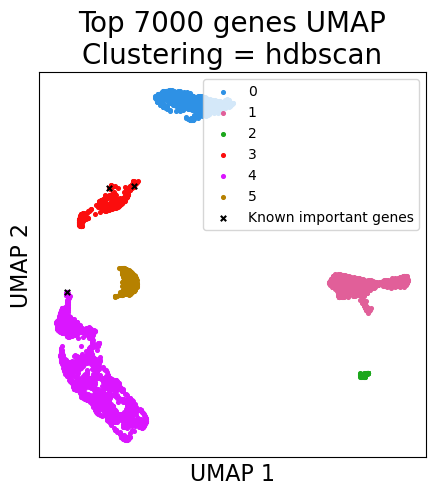

In [11]:
### Visualise top ranked genes graph
# Num_Top_Ranked_Genes is the second of the two paramaters that users should focus on when optimising
# the ESFS workflow for their data. Values between 3000-4000 are a typically good place to start.
Num_Top_Ranked_Genes = 7000

# The "Clustering" paramter can be set to an integer value if you wish to cluster genes in the UMAP with Kmeans clustering.
# Set "Clustering='hdbscan'" for automated density based clustering, and "Clustering=None" for no clustering.
Top_ESS_Genes, Gene_Clust_Labels, Gene_Embedding = esfs.Plot_Top_Ranked_Genes_UMAP(adata,Num_Top_Ranked_Genes,Clustering="hdbscan",Known_Important_Genes=Known_Important_Genes,hdbscan_min_cluster_size=100)
plt.show()

# If you would like to re-plot yourself, you may use the Gene_Clust_Labels, Gene_Embedding outputs.

### Visualise the cell clustering UMAPs for each of the groupings of genes identified in the previous step

This is stage of the worfklow is a critical step for trying out different input parameters to try and optimise the final results. The 2 main paramters to vary are the "Num_Top_Ranked_Genes" and the "Clustering" inputs for the Plot_Top_Ranked_Genes_UMAP function.

In breif, you are seeking a gene cluster or combination of gene cluster that reveal biological structure of interest by excluding clusters of genes that contribute a large amount of noise to downstream analysis.

In [12]:
### Get the cell UMAPs for each cluster of genes identified via the Plot_Top_Ranked_Genes_UMAP function.
# n_neighbors: Number of nearest neighbours and min_dist paramaters used for each cell UMAP.
# log_transformed: Determines whether the counts matrix is log2 transcformed (True) or not (False) before generating UMAPs.
# metric: The distance metric used for cell UMAP creation. Default is "correlation" 
# and we highly recommend "correlation" or "cosine", but you may try others.
Gene_Cluster_Embeddings, Gene_Cluster_Selected_Genes = esfs.Get_Gene_Cluster_Cell_UMAPs(adata,Gene_Clust_Labels,Top_ESS_Genes,n_neighbors=50,min_dist=0.1,log_transformed=False)

Generating the cell UMAP embeddings for each cluster of genes from the previous function.
Plotting cell UMAP using gene clusters 0
Plotting cell UMAP using gene clusters 1
Plotting cell UMAP using gene clusters 2
Plotting cell UMAP using gene clusters 3
Plotting cell UMAP using gene clusters 4
Plotting cell UMAP using gene clusters 5


/Users/radleya/The Francis Crick Dropbox/BriscoeJ/Radleya/ESFS_Paper/Paper_Submission/Git_Repository/ESFS/esfs/src/esfs/esfs.py:1380: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


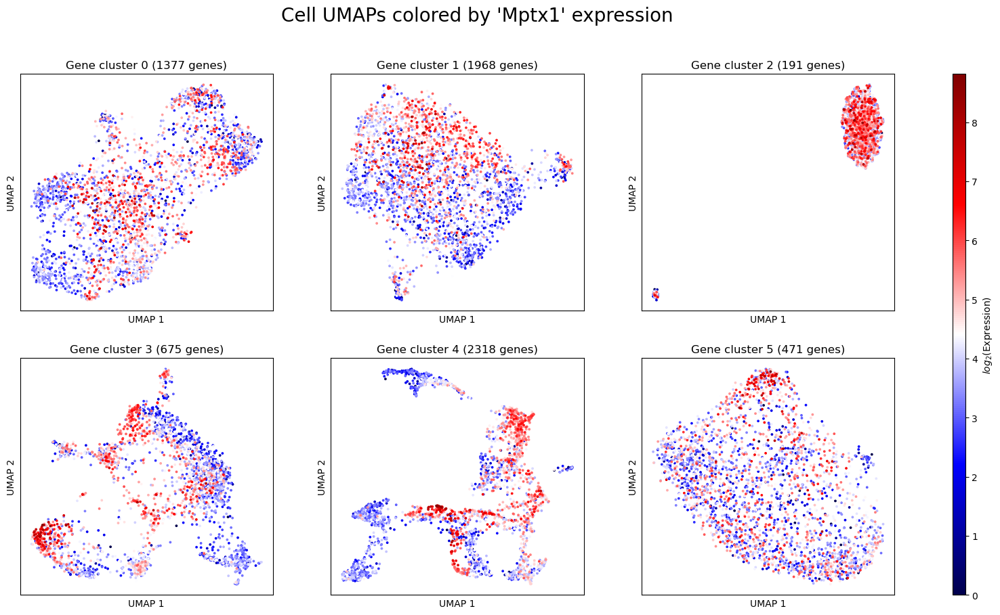

In [13]:
# Plot the cell UMAPs for each gene cluster.
esfs.Plot_Gene_Cluster_Cell_UMAPs(adata,Gene_Cluster_Embeddings,Gene_Cluster_Selected_Genes,Cell_Label="Mptx1",
    ncol=3,figsize=(18, 10),marker_size=3,log2_Gene_Expression=True)
plt.show()

### If you'd like to generate the cell UMAP for a specific cluster of a combination or clusters, use the specific_cluster parameter

For this workflow we find cluster 3 to be produce the most distinct and informative UMAP, so we use "specific_cluster=[3]".

In [14]:
Gene_Cluster_Embeddings, Gene_Cluster_Selected_Genes = esfs.Get_Gene_Cluster_Cell_UMAPs(adata,Gene_Clust_Labels,Top_ESS_Genes,specific_cluster=[4],n_neighbors=50,min_dist=0.1,log_transformed=False)

Generating the cell UMAP embeddings for each cluster of genes from the previous function.
Plotting cell UMAP using gene clusters [4]


/Users/radleya/The Francis Crick Dropbox/BriscoeJ/Radleya/ESFS_Paper/Paper_Submission/Git_Repository/ESFS/esfs/src/esfs/esfs.py:1380: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])


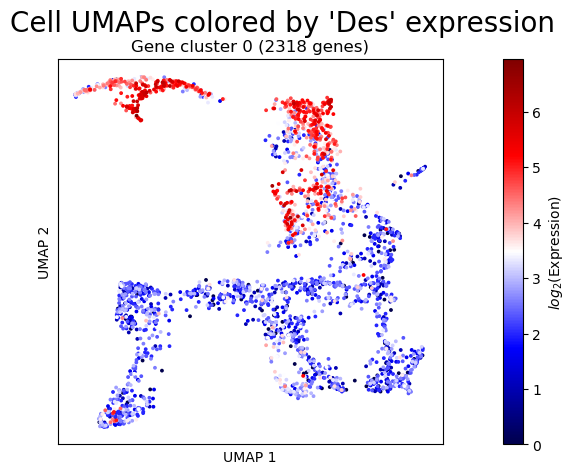

In [15]:
# Plot the cell UMAPs for each gene cluster.
esfs.Plot_Gene_Cluster_Cell_UMAPs(adata,Gene_Cluster_Embeddings,Gene_Cluster_Selected_Genes,Cell_Label="Des",
    ncol=1,figsize=(6, 5),marker_size=3,log2_Gene_Expression=True)
plt.show()

In [16]:
# Retain ES-GSS selected genes and resuting cel UMAP embedding
ES_GSS_Genes = Gene_Cluster_Selected_Genes[0].copy()
ES_UMAP_Embedding = Gene_Cluster_Embeddings[0].copy()

In [17]:
## For plotting, we often use the kNN smoothed expression. Using this function we can get the smoothed counts
# matrix according to the cell neighbourhoods in the gene expression space, sub-setted to the ES_GSS_Genes
adata = esfs.knn_Smooth_Gene_Expression(adata, ES_GSS_Genes, knn=50, metric='correlation', log_scale=False)

Computing batched correlation distances for 2604 cells, batch size = 1000
Smoothing expression matrix using mean over 50 neighbors...
Smoothed expression with knn = 50 saved to adata.layers['Smoothed_Expression']


### ES Marker Gene Selection

Having identified a set of genes that improves cell type seperation, we will use the use the Entropy Sorting Combinatorial Cluster Finder (ES-CCF) and Entropy Sorting Find Marker Gene (ES-FMG) algorithms to find a small set of marker genes that are optimised to capture distinct cell states.

A key input for the ES-CCF algorithm is cell labels after intentionally over-clustering the data. In this workflow we use Leiden clustering from the Scanpy package to over-cluster the data.

In [18]:
## First we subset the data to the ES_GMS_Genes genes and use the sc.pp.neighbors function to calculate the distance
# and neighbourhood arrays.
sub_adata = adata[:, ES_GSS_Genes].copy()
# Some Scanpy functions are slower on sparse matricies so we turn the sparse counts matrix into a dense one.
sub_adata.X = sub_adata.X.A
# n_pcs is set to 0 so the gene expression counts are used rather than latent principal components.
sc.pp.neighbors(sub_adata, n_neighbors=50, n_pcs=0, metric="correlation")
# Obtain UMAP co-ordinates
sc.tl.umap(sub_adata,min_dist=0.1)

/var/folders/r9/cmjg8gtj47xd5r03cdvsq6wr0000gp/T/ipykernel_6253/741271042.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(sub_adata,resolution = 8)


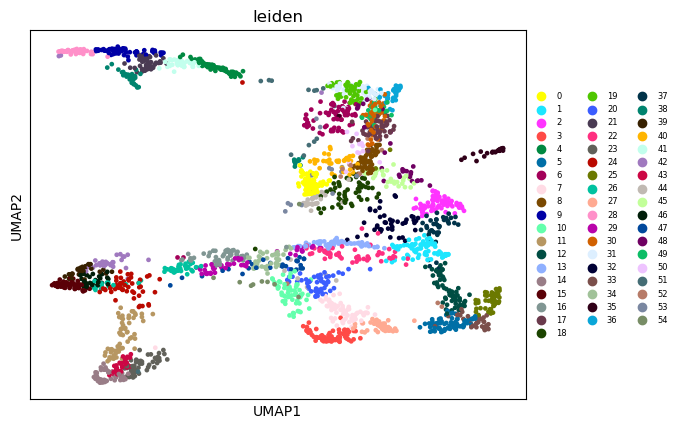

In [19]:
## Run leiden clustering with a relitively high resolution paramater to intentionally over-cluster the cells.
sc.tl.leiden(sub_adata,resolution = 8)
# Visualise the clustering
sc.pl.umap(sub_adata, color=['leiden'],legend_fontsize=6)

In [20]:
## Extract the cluster labels and add them to the adata object
Leiden_Clusts = np.asarray(sub_adata.obs['leiden'])
Unique_Leiden_Clusts = np.unique(Leiden_Clusts)
sample_labels = "Leiden_Clusts"
adata.obs[sample_labels] = Leiden_Clusts

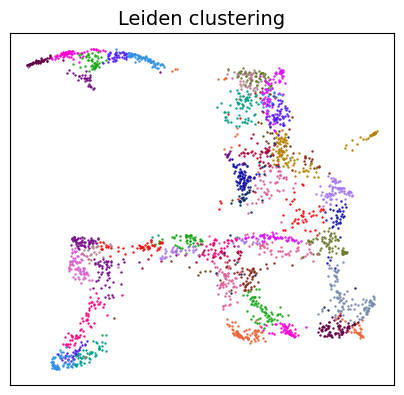

In [21]:
## Sometimes randomly shuffling the Unique_Leiden_Clusts IDs before plotting (to change cluster label colours)
# can help us better visualise the over-clustering.
Unique_Leiden_Clusts = np.unique(Leiden_Clusts)
np.random.shuffle(Unique_Leiden_Clusts)

plt.figure(figsize=(4,4))
plt.title("Leiden clustering",fontsize=14)
for i in np.arange(Unique_Leiden_Clusts.shape[0]):
    Inds = np.where(Leiden_Clusts == Unique_Leiden_Clusts[i])[0]
    plt.scatter(ES_UMAP_Embedding[Inds,0],ES_UMAP_Embedding[Inds,1],s=0.5)

plt.xticks([])
plt.yticks([]) 
#
plt.subplots_adjust(0.02,0.02,0.98,0.9)

# Re-set the Unique_Leiden_Clusts labels
Unique_Leiden_Clusts = np.unique(Leiden_Clusts)
plt.show()

Now we use the Leiden clusters as the input for ES-CCF to identify sets of samples/cells that maximise the correlation of each feature/gene in adata object.

By default the esfs.Parallel_Calc_ES_Matricies function calculates ES metrics of each feature in adata against each feature in adata (pairwise). However, esfs.Parallel_Calc_ES_Matricies may also be provided a set of "Secondary_Features", where each of these Secondary_Features will have ES metrics calculated pairwise against each feature in the adata object. Hence we refer to the Leiden cluster labels as secondary features.

In [22]:
# The Secondary_Features_Label will be used as a prefix to save resulting ES metrics to the adata object.
Secondary_Features_Label = "Leiden_Clusts_Secondary_Features"
# Using the pd.get_dummies function we convert the Leiden_Clusts vector into a one-hot representation where each 
# unique label becomes it's own feature of 0's and 1's.
Leiden_Clusts_Secondary_Features = csc_matrix(pd.get_dummies(Leiden_Clusts).astype("f"))
adata.obsm[Secondary_Features_Label] = Leiden_Clusts_Secondary_Features

We use Parallel_Calc_ES_Matricies to calculate the required metrics for ES combinatorial marker gene identification (save_matrices=np.array(["ESSs","SGs"])). 
Secondary_Features_Label designates a prefix for saving the ESS and SG outputs.

In [23]:
adata = esfs.Parallel_Calc_ES_Matricies(adata, Secondary_Features_Label=Secondary_Features_Label, save_matrices=np.array(["ESSs","SGs"]), Use_Cores=-1)

You have provided a 'Secondary_Features_Label', implying that in the anndata object there is a corresponding csc_sparse martix object with rows as samples and columns as features. Each feature will be used to calculate ES scores for each of the variables of the adata object
Cores Available: 16
Cores Used: 15
Calculating ESS and EP matricies.
If progress bar freezes consider increasing system memory or reducing number of cores used with the 'Use_Cores' parameter as you may have hit a memory ceiling for your machine.


  0%|          | 0/55 [00:00<?, ?it/s]

ESSs for Leiden_Clusts_Secondary_Features label have been saved to 'adata.varm['Leiden_Clusts_Secondary_Features_ESSs']'
SGs for Leiden_Clusts_Secondary_Features label have been saved to 'adata.varm['Leiden_Clusts_Secondary_Features_SGs']'


With the ESS and SG matricies saved to adata, we can use the ES_CCF function to identify which combination of Leiden Clusters maximises the correlation (ESS) or each feature/gene in adata. The main output of ES_CCF is a 2D array where each row is the samples of adata and each column is a feature representing the identified combination of Leiden Clusters that maximises the ESS score of the respective feature/gene column in adata.

The ES_CCF function prints where the ES_CCF outputs are saved in the adata object.

In [24]:
adata = esfs.ES_CCF(adata,Secondary_Features_Label)

For this function to work, you must have ran the Parallel_Calc_ES_Matricies function in a manner that attaches ESS and SG objects to your adata object that relate to your Secondary_Features_Label label.
Cores Available: 16
Cores Used: 15
Calculating ESS and EP matricies.
If progress bar freezes consider increasing system memory or reducing number of cores used with the 'Use_Cores' parameter as you may have hit a memory ceiling for your machine.


  0%|          | 0/13514 [00:00<?, ?it/s]

Max combinatorial ESSs for given sample labels has been saved as 'adata.varm['Leiden_Clusts_Secondary_Features_Max_Combinatorial_ESSs']'
The features/clusters relating to each Max_ESS have been saved in 'adata.obsm['Leiden_Clusts_Secondary_Features_Max_ESS_Features']'


#### Visualise Max ESS clusters
With the below script, you may select a gene and visualise the corresponding Max ESS cluster identified by the ES-CCF algorithm as maximally correlating/enriching the genes expression values in a group samples.

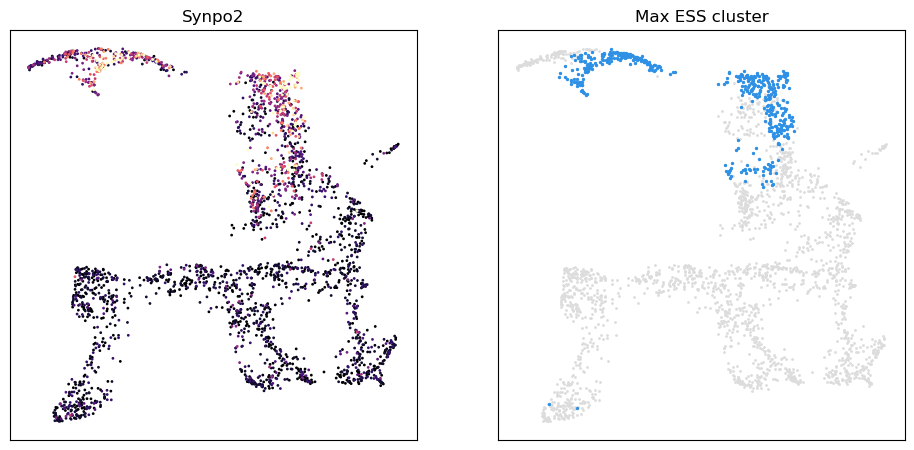

In [25]:
###
Gene = "Synpo2" # "B3gnt6", "Cyp2c65", "Malat1", "Mptx1", "Ang4", "Bc1", "Gsdmc3", "Slc37a2", "Nr4a1", "Clca3b", "Igsf9", "Des", "Il22ra2", "H2-Aa", "Igha"
###
Gene_Ind = np.where(adata.var_names == Gene)[0]
Inds = np.where(adata.obsm['Leiden_Clusts_Secondary_Features_Max_ESS_Features'][:,Gene_Ind].A == 1)[0]
plt.figure(figsize=(4.66*2,2.33*2))
plt.subplot(1,2,1)
plt.title(Gene,fontsize=12)
Exp = np.asarray(adata[:,Gene].X.A).ravel()
Exp = np.clip(Exp,a_min=0,a_max=np.percentile(Exp,97.5))
norm = FuncNorm((_inverse, _forward), vmin=np.min(Exp), vmax=np.max(Exp))
Order = np.argsort(Exp)
plt.scatter(ES_UMAP_Embedding[Order,0],ES_UMAP_Embedding[Order,1],c=Exp[Order],s=1,cmap="magma")
plt.xticks([])
plt.yticks([])
plt.subplot(1,2,2)
plt.title("Max ESS cluster",fontsize=12)
plt.scatter(ES_UMAP_Embedding[:,0],ES_UMAP_Embedding[:,1],s=1,c="gainsboro")
plt.scatter(ES_UMAP_Embedding[Inds,0],ES_UMAP_Embedding[Inds,1],s=2)
plt.xticks([])
plt.yticks([])
#
plt.subplots_adjust(0.02,0.02,0.98,0.9)

plt.show()

The 2D array of combined Leiden Clusters that maximise adata feature/gene ESSs is then used by Parallel_Calc_ES_Matricies as set of secondary features to obtain the ESS scores of each feature/gene in adata against each identified structure maximising feature. This creates a 2D pairwise adata feature/gene Vs coarse grain combined Leiden Cluster correlation matrix.

Plainly, we obtain a correlation matrix that quantifies how well each gene correlates to the ES-CCF optimised clusters for each gene. These correlations act as a proxy for where are best enriched in the combinatorial cluster space of the intentionally over-clustered data.

In [26]:
# Set the Leiden cluster Max ESS Features as the new secondary features
Secondary_Features_Label = "Leiden_Clusts_Secondary_Features_Max_ESS_Features"
adata = esfs.Parallel_Calc_ES_Matricies(adata, Secondary_Features_Label=Secondary_Features_Label, save_matrices=np.array(["ESSs"]), Use_Cores=-1)

You have provided a 'Secondary_Features_Label', implying that in the anndata object there is a corresponding csc_sparse martix object with rows as samples and columns as features. Each feature will be used to calculate ES scores for each of the variables of the adata object
Cores Available: 16
Cores Used: 15
Calculating ESS and EP matricies.
If progress bar freezes consider increasing system memory or reducing number of cores used with the 'Use_Cores' parameter as you may have hit a memory ceiling for your machine.


  0%|          | 0/13514 [00:00<?, ?it/s]

ESSs for Leiden_Clusts_Secondary_Features_Max_ESS_Features label have been saved to 'adata.varm['Leiden_Clusts_Secondary_Features_Max_ESS_Features_ESSs']'


### ES-FMG
Now that we have a coarse grain represenation of where gene structure is maximised in different regions of the data, we can use esfs.ES_FMG to identify a minimal set of clusters/genes that captures that most unique/non-overlapping structure in the data. This minimal gene set may be thought of as an optimised set of unsuperised marker genes.

In [27]:
Secondary_Features_Label
Num_Genes = 200
Chosen_Clusters, Chosen_Genes, Chosen_Pairwise_ESSs = esfs.ES_FMG(adata,Num_Genes,Secondary_Features_Label,Resolution=0.7)

Cores Available: 16
Cores Used: 15
Current highest score: 2.6069176107877237
Current highest score: 2.6903348395954296
Current highest score: 2.770676402515383
Current highest score: 2.847094492863299
Current highest score: 2.9207268865660008
Current highest score: 2.9878016552813467
Current highest score: 3.0538661749428493
Current highest score: 3.118044286709108
Current highest score: 3.179671894359855
Current highest score: 3.2341007809456714
Current highest score: 3.2868383454511996
Current highest score: 3.339204629727216
Current highest score: 3.390429416302538
Current highest score: 3.4393339189795236
Current highest score: 3.4865568854296924
Current highest score: 3.533507272687765
Current highest score: 3.5804131800893737
Current highest score: 3.626362809710184
Current highest score: 3.6722041778251966
Current highest score: 3.7175960215478927
Current highest score: 3.7609021036292773
Current highest score: 3.8050208370490033
Current highest score: 3.8469119179030926
Current

ES-FMG produces 3 outputs:
 
Chosen_Genes - The optimised set of N marker genes.

Chosen_Clusters - The Max ESS cluster indicies. Subsetting all adata genes to the Chosen_Clusters inds should yeild the same output as Chosen_Genes (adata.var_names[Chosen_Clusters]).

Chosen_Pairwise_ESSs - A pairwise matrix of the Chosen genes and their ESSs with the corresponding Max ESS clusters. The diadonal of this matrix is the ESS of the given marker gene with its Max ESS cluster.

#### Data visualisation
Now that we have a set of optimised marker genes, we may visualise and interpret the results. Below is a simple script to visualise expression in the UMAP and spatial transcriptomics space.

We recommend saving plots for each of the ES-FMG "Chosen_Genes" and inspecting them to visualise where the optimised set of marker genes capture different populations of samples.

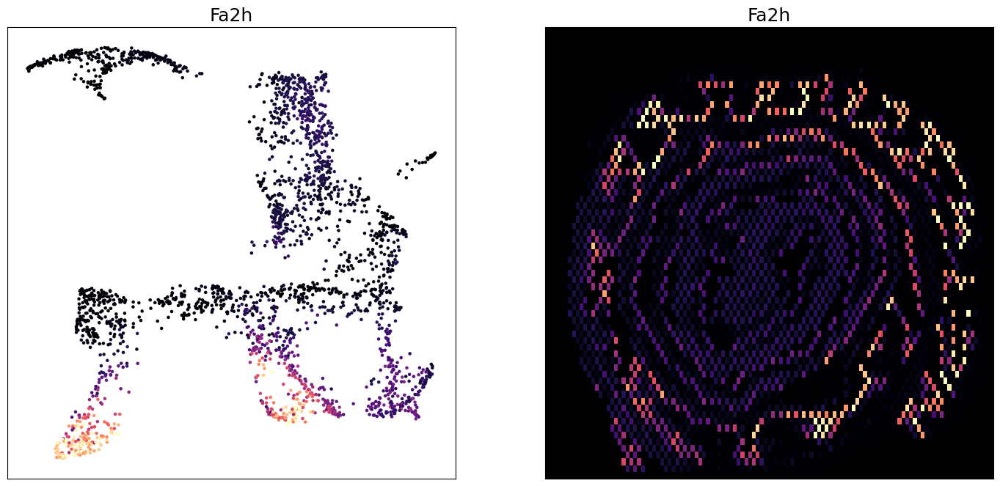

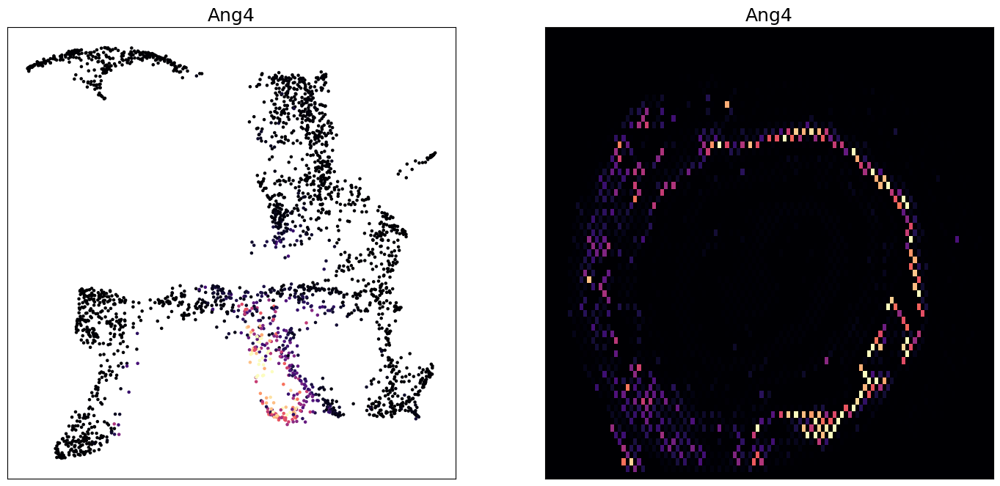

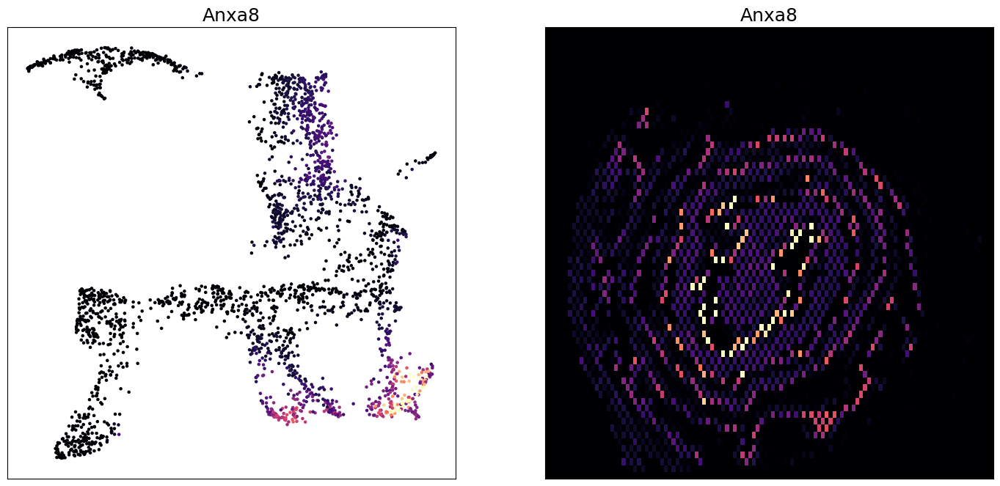

In [28]:
###
Plot_Genes = np.array(["Fa2h","Ang4","Anxa8"])
###

###
# plot_save_path = "" Edit and uncomment to set the save path for plots
# Plot_Genes = Chosen_Genes.copy()
###

for i in np.arange(Plot_Genes.shape[0]):
    Gene = Plot_Genes[i]
    plt.figure(figsize=(14,7))
    #
    plt.subplot(1,2,1)
    plt.title(Gene,fontsize=18)
    Exp = np.asarray(adata[:,Gene].layers['Smoothed_Expression'].A).ravel()
    Exp = np.clip(Exp,a_min=0,a_max=np.percentile(Exp,99))
    norm = FuncNorm((_inverse, _forward), vmin=np.min(Exp), vmax=np.max(Exp))
    Order = np.argsort(Exp)
    Order = np.arange(ES_UMAP_Embedding.shape[0])
    plt.scatter(ES_UMAP_Embedding[Order,0],ES_UMAP_Embedding[Order,1],c=Exp[Order],s=5,cmap="magma",norm=norm)
    plt.xticks([])
    plt.yticks([])
    #
    plt.subplot(1,2,2)
    plt.title(Gene,fontsize=18)
    Grid = np.zeros((np.max(adata.obsm['spatial_coordinates'][:,0]+1),np.max(adata.obsm['spatial_coordinates'][:,1]+1)))
    Grid[adata.obsm['spatial_coordinates'][:,0],adata.obsm['spatial_coordinates'][:,1]] = Exp
    plt.imshow(Grid,cmap="magma",aspect="auto",norm=norm)  
    plt.xticks([])
    plt.yticks([]) 
    #
    plt.subplots_adjust(0.02,0.02,0.98,0.9)
    #
    # plt.savefig(plot_save_path + Gene + ".png",dpi=600)
    # plt.close()

plt.show()

### ES Marker Genes Vs. NMF
To demonstrate the ability of our ES marker gene software to identify distinct gene expression patterns in single cell RNA sequencing data, we compare it against non-negative matrix factorisation (NMF).

In [29]:
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from scipy.optimize import linear_sum_assignment

As outlined in our manuscript, we followed the suggested workflow of cNMF package to generate a set of latent factors (U). Below we compare the obtained latent factors against the marker genes identified by ES-FMG.

In [30]:
# Load cNMF latent factors
U = pd.read_csv(path+"cNMF_Latent_Factors.txt",sep="\t",index_col=0)
U = np.asarray(U)


Now we match the most similar latent features between the ES-FMG features and cNMF latent factors using the cosine similarity metric, while only allowing a feature to be paried with another feature once.

In [31]:
A = adata[:,Chosen_Genes].layers["Smoothed_Expression"].A
A_T = A.T  
U_T = U.T  
# Step 1: Compute similarity matrix
similarity_matrix = cosine_similarity(A_T, U_T)  #
# Step 2: Convert to cost matrix (negate similarity since we want to maximize)
cost_matrix = -similarity_matrix
# Step 3: Solve assignment problem (Hungarian algorithm)
row_ind, col_ind = linear_sum_assignment(cost_matrix)
# Now: A[:, row_ind[i]] matches uniquely to U[:, col_ind[i]]
matches = list(zip(row_ind, col_ind))

We can now visualise the spatial expression profiles of individual genes against their more similar latent factor identified through cNMF. Below we provide the Plot_Spatial_Gene_NMF_Comparisons function to do so.

In [32]:

def Plot_Spatial_Gene_NMF_Comparisons(Gene, similarity_matrix, U, S, figsize=(15, 5)):
    # Get the matching gene and its most similar factor
    Ind_1 = np.where(Chosen_Genes == Gene)[0]
    Gene = Chosen_Genes[Ind_1][0]
    Ind_2 = np.argmax(similarity_matrix[Ind_1, :])
    Factor = Ind_2

    # Shared coordinates
    x = adata.obsm['spatial_coordinates'][:, 1]
    y = adata.obsm['spatial_coordinates'][:, 0]

    # Prepare subplots with user-defined figure size
    fig, axes = plt.subplots(1, 3, figsize=figsize)

    # Titles and colorbar labels
    titles = [
        f"ES-FMG raw expression: {Gene}",
        f"ES-FMG kNN expression: {Gene}",
        f"cNMF: Factor {Factor + 1}"
    ]
    colorbar_labels = ["expression", "expression", "factor loading"]

    # Values to plot
    values_list = [
        np.asarray(adata[:, Gene].X.A).ravel(),
        np.asarray(adata[:, Gene].layers["Smoothed_Expression"].A).ravel(),
        U[:, Ind_2]
    ]

    # Loop through subplots
    for ax, vals, title, label in zip(axes, values_list, titles, colorbar_labels):
        vals = np.clip(vals, a_min=0, a_max=np.percentile(vals, 99))
        norm = FuncNorm((_inverse, _forward), vmin=vals.min(), vmax=vals.max())
        cmap = get_cmap("magma")

        # Plot scatter
        sc = ax.scatter(
            x, y,
            c=vals,
            cmap=cmap,
            norm=norm,
            marker="h",
            s=S,
            linewidths=0
        )

        # Style plot
        ax.set_facecolor("black")
        ax.set_title(title, fontsize=14)
        ax.invert_yaxis()
        ax.set_xticks([]); ax.set_yticks([])
        ax.set_xlim(5, 116)
        ax.set_ylim(66.5, 4.5)

        # Add colorbar to the right
        divider = make_axes_locatable(ax)
        cax = divider.append_axes("right", size="5%", pad=0.05)
        cbar = fig.colorbar(sc, cax=cax)
        cbar.set_label(label)

    # Adjust layout to prevent overlap
    plt.tight_layout(pad=3.0)
    plt.show()

/var/folders/r9/cmjg8gtj47xd5r03cdvsq6wr0000gp/T/ipykernel_6253/131276108.py:34: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = get_cmap("magma")


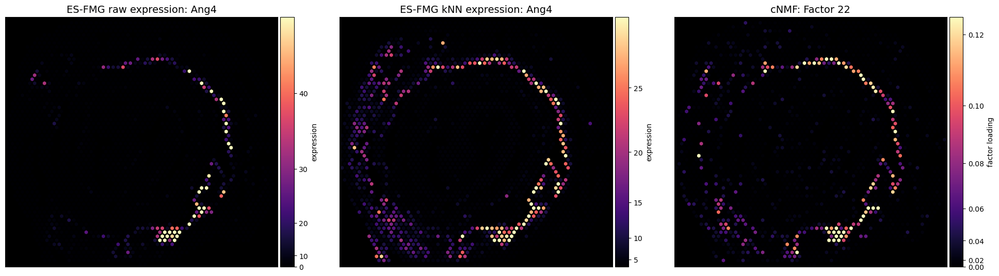

In [33]:
S = 30
Plot_Spatial_Gene_NMF_Comparisons("Ang4",similarity_matrix,U,S,figsize=(20, 6))

### Save results
Some suggested objects to save for reproducibility (un-comment to use).

In [34]:
# # The adata object with saved ES arrays
# adata.write_h5ad(path+"ES_adata.h5ad",compression='gzip')
# # The cell UMAP embedding
# np.save(path+"ES_UMAP_Embedding.npy",ES_UMAP_Embedding)
# # The ES-GSS gene set that produced the cell UMAP embedding
# np.save(path+"ES_GSS_Genes.npy",ES_GSS_Genes)
# # The Leiden clusters generated during intentional over-clustering
# np.save(path+"Leiden_Clusts.npy",Leiden_Clusts)
# # The optimised gene set selected by ES-FMG
# Chosen_Genes = np.load(path+"ES_FMG_Marker_Genes.npy")
# # The optimised gene set indices/Max ESS cluster indices selected by ES-FMG
# Chosen_Clusters = np.load(path+"ES_FMG_Chosen_Clusters.npy")